In [1]:
import os
import pickle
from glob import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
from scipy.stats import pearsonr
from scipy.stats import gaussian_kde

In [2]:
def scatter_plot(x, y, xlabel, ylabel, title):
    g = sns.JointGrid()
    sns.scatterplot(x=x, y=y, ax=g.ax_joint) # can set s=10
    sns.kdeplot(x=x, linewidth=2, ax=g.ax_marg_x) 
    sns.kdeplot(y=y, linewidth=2, ax=g.ax_marg_y)

    g.ax_joint.set(xlabel=xlabel, ylabel=ylabel)

    g.ax_joint.plot([np.min(x), np.max(x)], [np.min(x), np.max(x)], linewidth=1.0, color='black', linestyle='solid', label='Equality Line')

    X_mat=np.vstack((np.ones(len(x)), x)).T
    beta_hat = np.linalg.inv(X_mat.T.dot(X_mat)).dot(X_mat.T).dot(y)
    b,w = beta_hat[0],beta_hat[1]
    x2 = np.linspace(np.min(x),np.max(x),num=10)
    y2 = w * x2 + b

    g.ax_joint.plot(x2, y2, 'r--', linewidth=3.0, label='Linear Regression Line')
    g.ax_joint.legend()
    
    pearson_correlation = pearsonr(x,y)[0]

    g.ax_joint.text(np.max(x), np.min(y)+0.05*np.abs(np.min(y2)), 'R='+str(round(pearson_correlation,3)), horizontalalignment='right', fontsize='large')
    print("Reg Slope:", w)

    g.fig.suptitle(title, y=1.05)

    plt.show()

def scatter_plot_heatmap(x, y, xlabel, ylabel, title, equality_line=True, set_scale=False):
    
    x = x.to_numpy()
    y = y.to_numpy()
    
    fig = plt.figure(figsize=[7.2, 7.2])
    sns.set_style("darkgrid", {'image.cmap': u'plasma'})
    xy = np.vstack([x,y])
    z = gaussian_kde(xy)(xy)
    # Sort the points by density, so that the densest points are plotted last
    idx = z.argsort()
    x, y, z = x[idx], y[idx], z[idx]
    plt.scatter(x,y,c=z,s=50)
    if equality_line == True:
        plt.plot(x, x, ls="-", color = sns.xkcd_rgb['black'], label='Equality Line') #this is just the line of equality
    
    X_mat=np.vstack((np.ones(len(x)), x)).T
    beta_hat = np.linalg.inv(X_mat.T.dot(X_mat)).dot(X_mat.T).dot(y)
    b,w = beta_hat[0],beta_hat[1]
    x2 = np.linspace(np.min(x),np.max(x),num=10)
    y2 = w * x2 + b
    plt.plot(x2,y2,ls='--', color= sns.xkcd_rgb['red'], label='Linear Regression Line')
    
    pearson_correlation = pearsonr(x,y)[0]
#     plt.text(np.max(x), np.min(y)+0.05*np.abs(np.min(y2)), 'R='+str(round(pearson_correlation,3)), horizontalalignment='right', fontsize='large')
    
    if set_scale == True:
        x_min, x_max = np.min(x), np.max(x)
        y_min, y_max = np.min(y), np.max(y)
        c_min, c_max = min(x_min, y_min), max(x_max, y_max)
        plt.xlim([c_min-2, c_max+2])
        plt.ylim([c_min-2, c_max+2])
    
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    
    lbl = 'Pearson R = '+str(round(pearson_correlation,3))
    plt.plot([],[],' ',label=lbl)
    
    plt.title(title)
    plt.legend()
    plt.show()
    
    
def get_corr_plot(array, title, labels, partial_correlation=False, fig_size=None, fix_colorbar_scale=False,
                 xlabel=None, ylabel=None):
    with sns.axes_style("white"):
        if fig_size == None:
            fig = plt.figure() # can set figsize=(fig_size = 12.8, fig_size)
        else:
            fig = plt.figure(figsize=(fig_size, fig_size))
        ax = fig.add_subplot(111)
        if fix_colorbar_scale == True:
            cax = ax.matshow(array, interpolation='nearest',cmap='viridis', vmin=0, vmax=1)
        else:
            cax = ax.matshow(array, interpolation='nearest',cmap='viridis')
        fig.colorbar(cax)
        if partial_correlation == False:
            intro = "Pearson R"
        else:
            intro = "Partial Correlation"
        plt.title("{} for {}".format(intro, title), fontsize=fig_size+5 if fig_size != None else 10)
        ax.set_yticks(np.arange(len(labels)))
        ax.set_yticklabels(labels)
        ax.xaxis.set_ticks_position("bottom")
        ax.set_xticks(np.arange(len(labels)))
        ax.set_xticklabels(labels, rotation=90)
        if xlabel is not None:
            ax.set_xlabel(xlabel)
        if ylabel is not None:
            ax.set_ylabel(ylabel)
        plt.show()

def correlation_plot(df, key, title, partial_correlation= False, fig_size=None, fix_colorbar_scale=False):
    
    names = df.modality.to_list()
    
    if partial_correlation == False:
        corr_df1 = []
        for idx1 in range(len(df)):
            df1 = df.iloc[idx1].dataframe
            corr_df2 = []
            for idx2 in range(len(df)):
                df2 = df.iloc[idx2].dataframe
                r, _ = pearsonr(df1[key], df2[key])
                corr_df2.append(r)
            corr_df2 = np.array(corr_df2).astype('float32')
            corr_df1.append(corr_df2)
        corr_df1 = np.array(corr_df1).astype('float32')
        get_corr_plot(corr_df1, labels=names, partial_correlation=partial_correlation,
                      title=title, fig_size=fig_size, fix_colorbar_scale=fix_colorbar_scale) 
    else:
        tmp_dct = {}
        for idx in range(len(df)):
            tmp_df = df.iloc[idx].dataframe[key]
            tmp_dct[names[idx]] = tmp_df.to_numpy()
        pcorr_df = pd.DataFrame.from_dict(tmp_dct)
        del tmp_dct, tmp_df
        
        # This implementation comes from https://pingouin-stats.org/index.html
        # Source code here for pcorr: https://github.com/raphaelvallat/pingouin/blob/72e447d539f8cfbd6b9c9c5041e267de748fe124/pingouin/correlation.py

        V = pcorr_df.cov()
        Vi = np.linalg.pinv(V, hermitian=True)
        D = np.diag(np.sqrt(1 / np.diag(Vi)))
        pcor = -1 * (D @ Vi @ D)
        pcor[np.diag_indices_from(pcor)] = 1
        get_corr_plot(pcor, labels=names, partial_correlation=partial_correlation,
                      title=title, fig_size=fig_size, fix_colorbar_scale=fix_colorbar_scale) 
        
def kde_plot(x, y, xlabel, ylabel, title):
    plt.figure()
    sns.kdeplot(x, label='Ground Truth')
    sns.kdeplot(y, label= ylabel)
    plt.legend()
    plt.title(title)

In [3]:
# df = pd.read_pickle('female_test_prototype.pkl')
df = pd.read_pickle('female_test_testB_convergence9.pkl')
# df = pd.read_pickle('female_train.pkl')
# df = pd.read_pickle('female_testA.pkl')

In [4]:
df.iloc[0].dataframe

,Unnamed: 0,target_age,output_age_1,age_delta_1,loss_1,output_age_2,age_delta_2,loss_2,output_age_3,age_delta_3,...,output_age_8,age_delta_8,loss_8,output_age_9,age_delta_9,loss_9,mean_output_age,mean_age_delta,output_age_decon,age_delta_decon
0,24237795,77.280940,72.701675,-4.579262,20.969639,74.382744,-2.898193,8.399525,73.788110,-3.492828,...,70.761940,-6.518997,42.497326,72.915350,-4.365585,19.058334,72.963637,-4.317303,74.620441,-2.660499
1,25463415,58.056694,59.612404,1.555710,2.420233,60.072525,2.015831,4.063575,58.784576,0.727882,...,59.886410,1.829716,3.347860,58.388590,0.331898,0.110156,59.641720,1.585026,58.933942,0.877248
2,25313661,59.653084,55.311880,-4.341206,18.846066,56.850100,-2.802982,7.856710,55.540500,-4.112583,...,56.367317,-3.285767,10.796262,56.161120,-3.491962,12.193802,56.117516,-3.535568,54.784207,-4.868877
3,23521455,53.088700,55.214600,2.125900,4.519452,54.453920,1.365219,1.863823,54.161118,1.072418,...,53.427460,0.338760,0.114759,53.883030,0.794331,0.630961,54.115348,1.026648,52.426663,-0.662037
4,25206481,50.428654,52.410316,1.981663,3.926987,51.553112,1.124458,1.264406,50.006413,-0.422241,...,50.439816,0.011162,0.000125,49.834167,-0.594486,0.353414,50.656148,0.227494,48.353470,-2.075184
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2505,25785977,55.227055,61.862778,6.635723,44.032820,60.457240,5.230187,27.354850,60.595250,5.368195,...,60.783050,5.555996,30.869091,60.140150,4.913094,24.138489,60.861500,5.634445,60.370228,5.143173
2506,25068363,61.883446,63.208225,1.324779,1.755041,62.827950,0.944504,0.892087,65.065180,3.181732,...,62.040924,0.157478,0.024799,60.018467,-1.864979,3.478146,63.101436,1.217990,63.007743,1.124297
2507,22834218,60.501940,60.638573,0.136631,0.018668,61.598965,1.097023,1.203459,61.849216,1.347275,...,57.722404,-2.779537,7.725827,62.027424,1.525482,2.327096,60.572131,0.070191,60.029497,-0.472443
2508,24442683,56.130707,53.978462,-2.152245,4.632157,51.637170,-4.493538,20.191883,52.479760,-3.650948,...,54.830600,-1.300106,1.690276,53.143036,-2.987671,8.926177,52.936217,-3.194490,51.038242,-5.092465


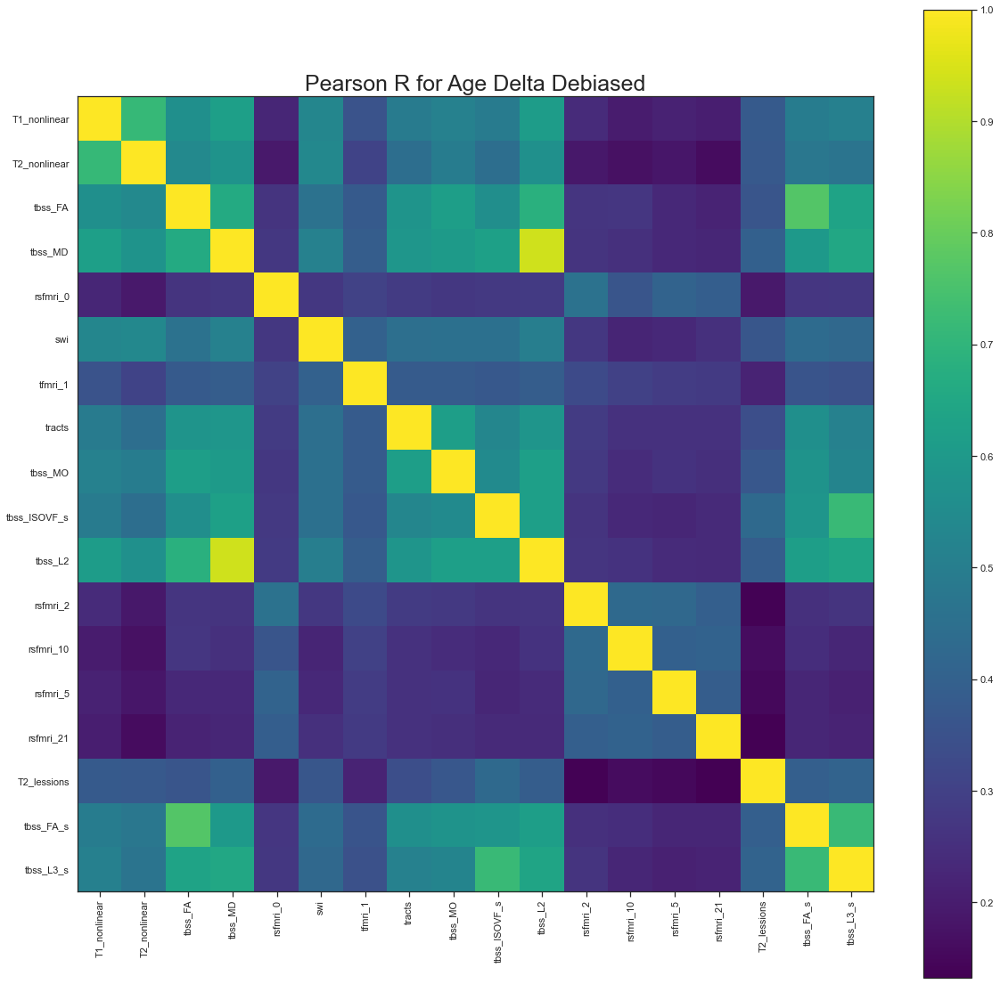

In [36]:
# correlation_plot(df, key='mean_output_age', title='Mean Output Age', fig_size=20)
# correlation_plot(df, key='mean_age_delta', title='Mean Age Delta', fig_size=20)
# correlation_plot(df, key='output_age_decon', title='Output Age Deconfounded', fig_size=20)
correlation_plot(df, key='age_delta_decon', title='Age Delta Debiased', 
                 partial_correlation=False, fig_size=20)
# correlation_plot(df, key='age_delta_decon', title='Age Delta Deconfounded', fig_size=20, 
#                  partial_correlation=False, fix_colorbar_scale=True)

# correlation_plot(df, key='mean_output_age', title='Mean Output Age', fig_size=20)
# correlation_plot(df, key='mean_age_delta', title='Mean Age Delta', fig_size=20)
# correlation_plot(df, key='output_age_decon', title='Output Age Deconfounded', fig_size=20)
# correlation_plot(df, key='age_delta_decon', title='Age Delta Debiased', 
#                  partial_correlation=False, fig_size=20)
# correlation_plot(df, key='age_delta_decon', title='Age Delta Deconfounded', fig_size=20, 
#                  partial_correlation=False, fix_colorbar_scale=True)

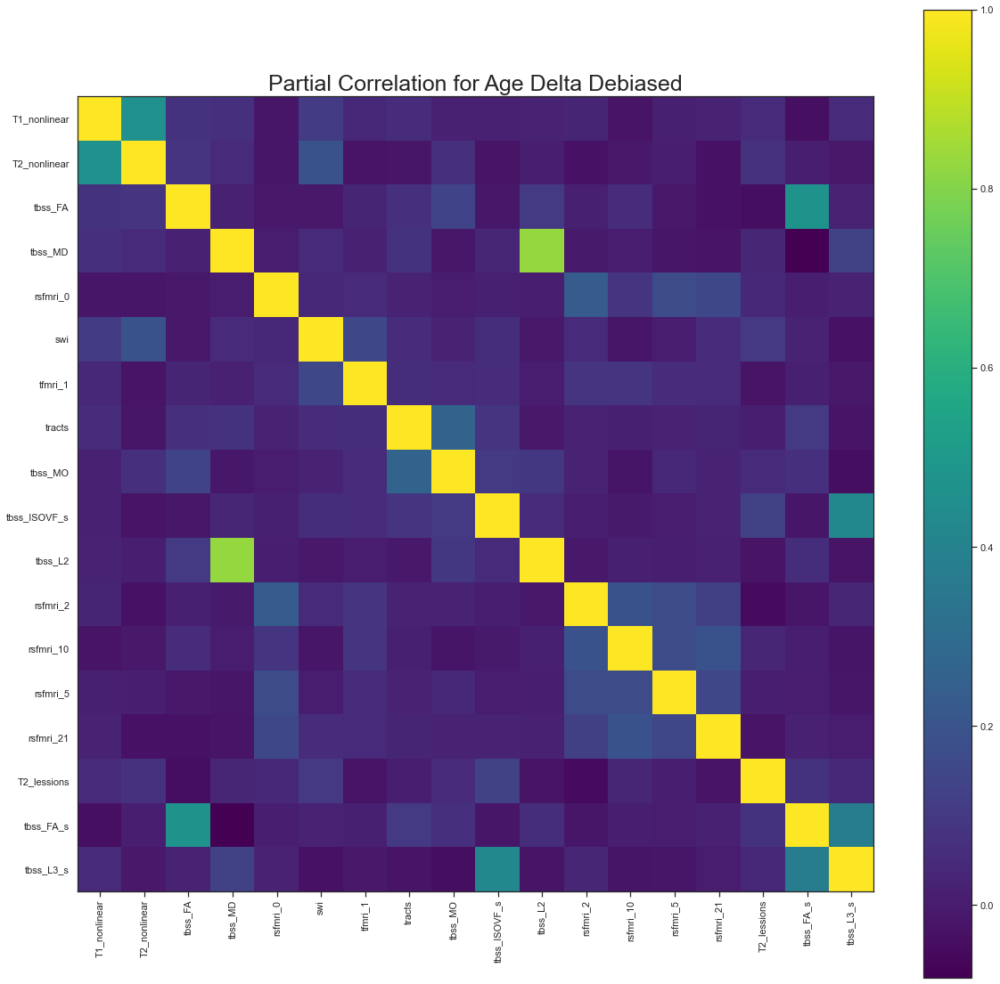

In [37]:
correlation_plot(df, key='age_delta_decon', title='Age Delta Debiased', 
                 partial_correlation=True, fig_size=20)
# correlation_plot(df, key='age_delta_decon', title='Age Delta Deconfounded', fig_size=20, 
#                  partial_correlation=True, fix_colorbar_scale=True)

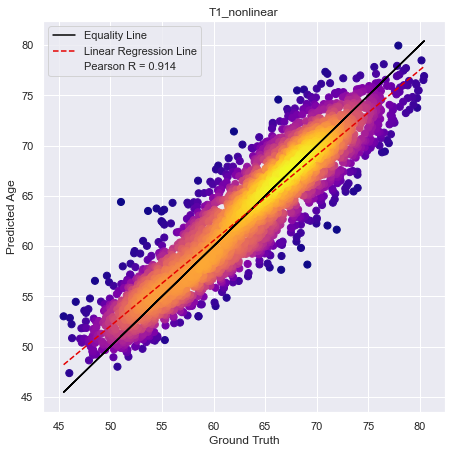

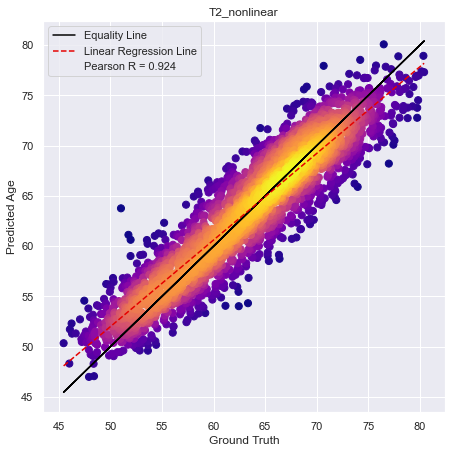

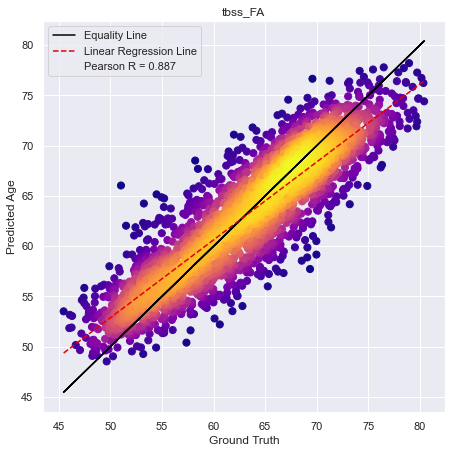

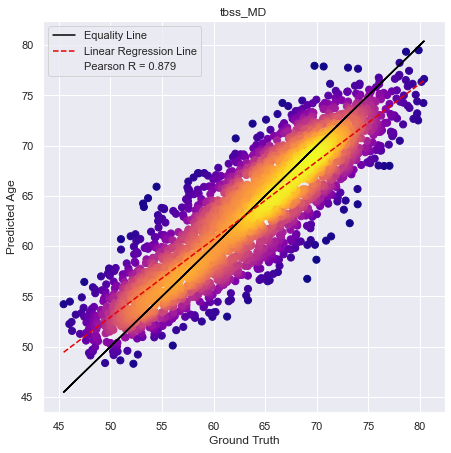

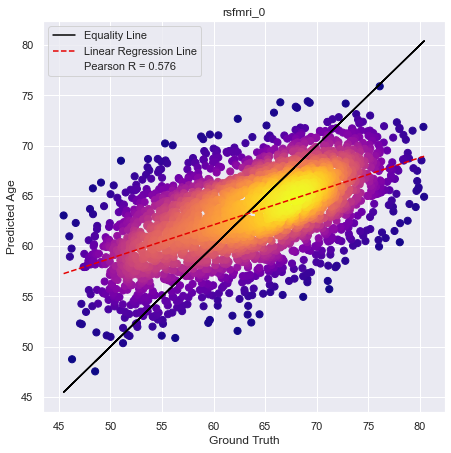

...

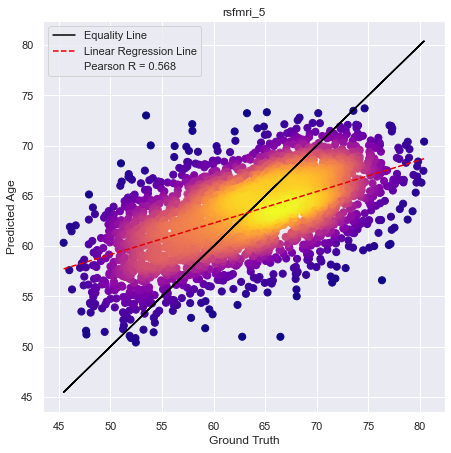

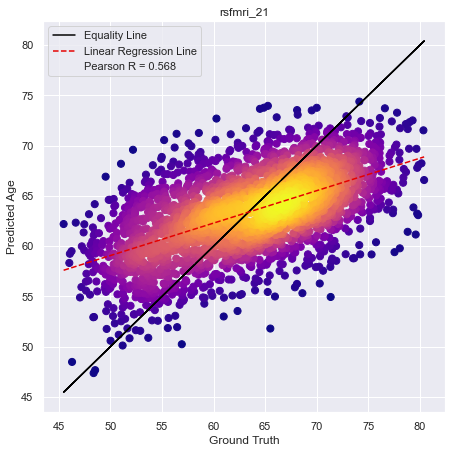

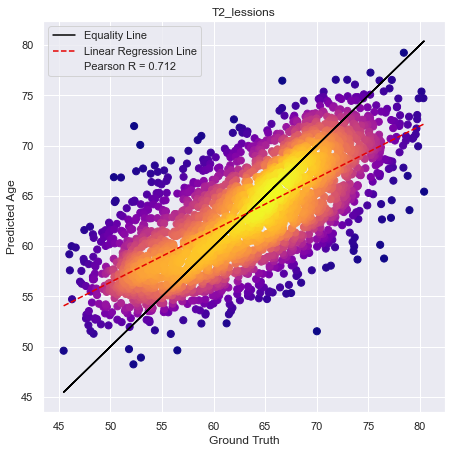

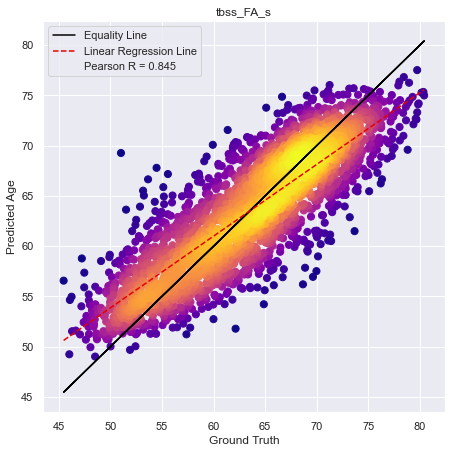

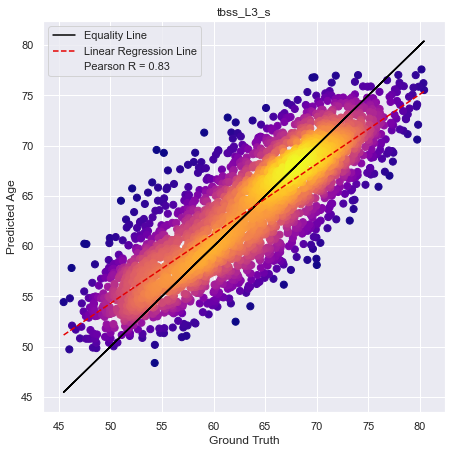

In [38]:
for idx in range(len(df)):
    df_mod = df.iloc[idx].dataframe
    name_mod = df.iloc[idx].modality
    fig = scatter_plot_heatmap(x=df_mod.target_age, y=df_mod.mean_output_age, xlabel='Ground Truth', 
                               ylabel='Predicted Age', title=name_mod, set_scale=True)

# for idx in range(len(df)):
#     df_mod = df.iloc[idx].dataframe
#     name_mod = df.iloc[idx].modality
#     fig = scatter_plot_heatmap(x=df_mod.target_age, y=df_mod.output_age, xlabel='Ground Truth', 
#                                ylabel='Predicted Age', title=name_mod, set_scale=True)

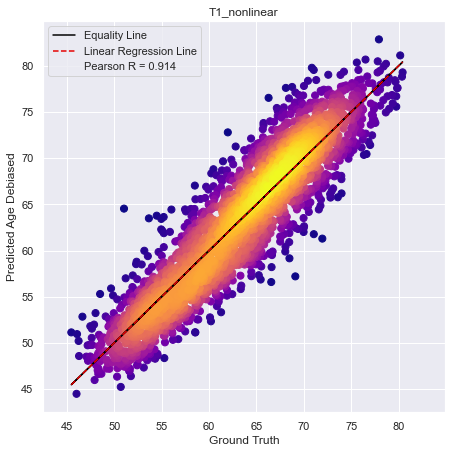

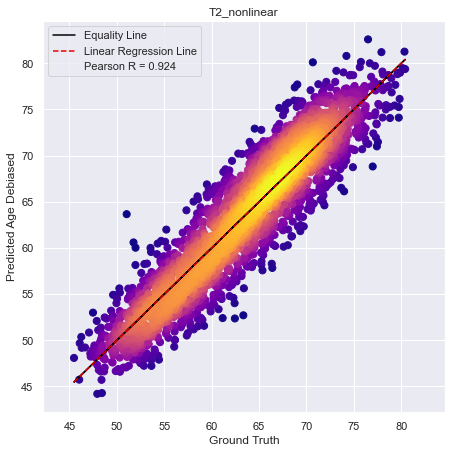

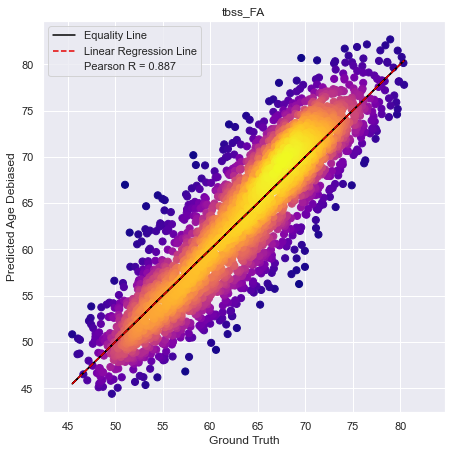

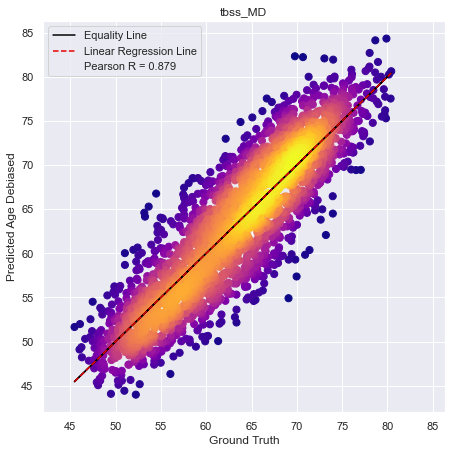

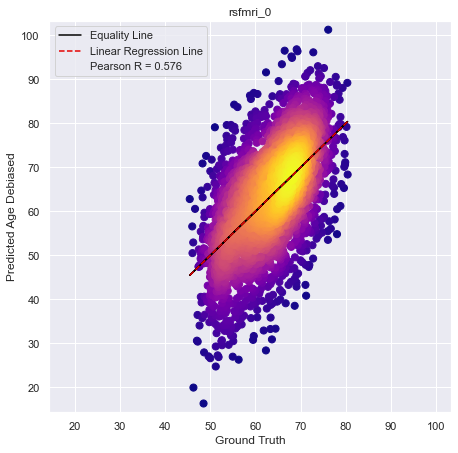

...

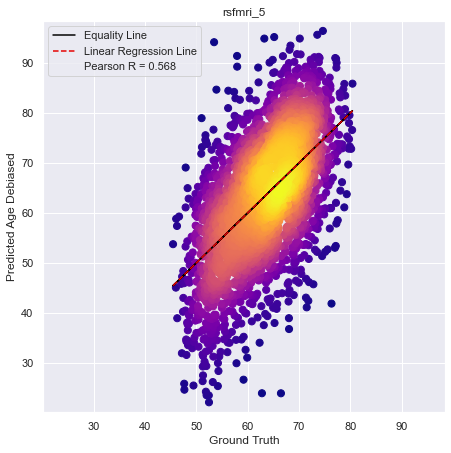

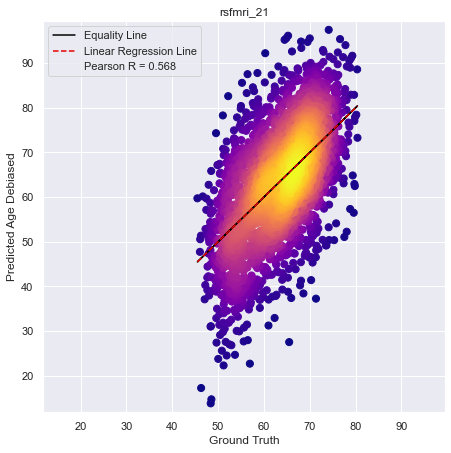

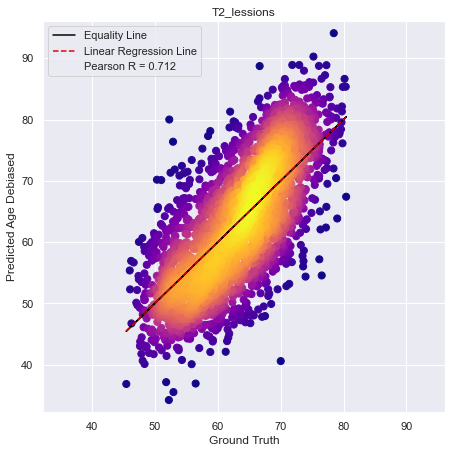

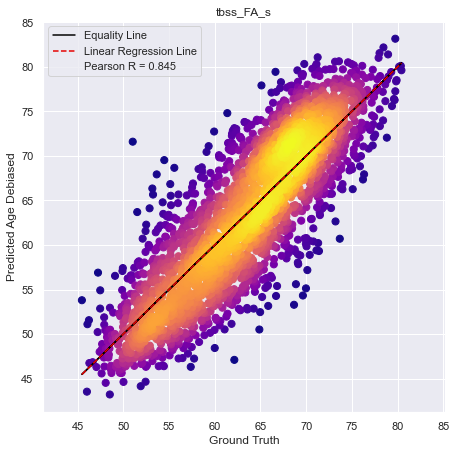

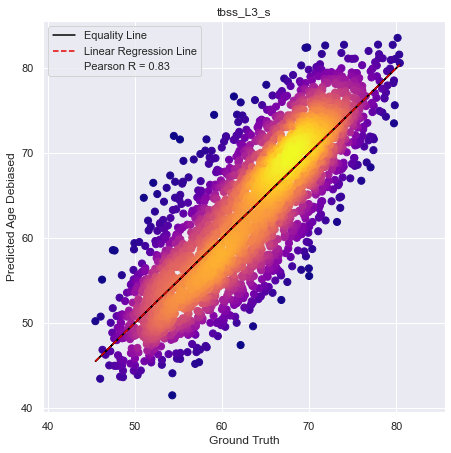

In [39]:
for idx in range(len(df)):
    df_mod = df.iloc[idx].dataframe
    name_mod = df.iloc[idx].modality
    fig = scatter_plot_heatmap(x=df_mod.target_age, y=df_mod.output_age_decon, xlabel='Ground Truth', 
                               ylabel='Predicted Age Debiased', title=name_mod, set_scale=True)

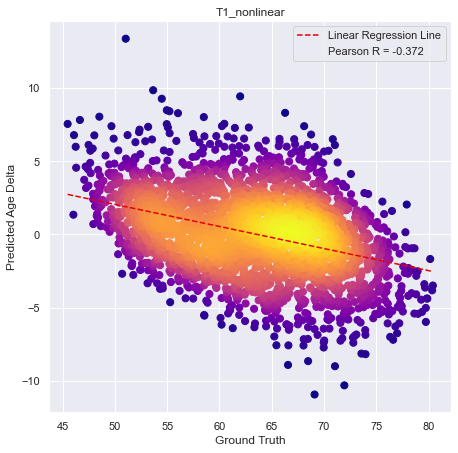

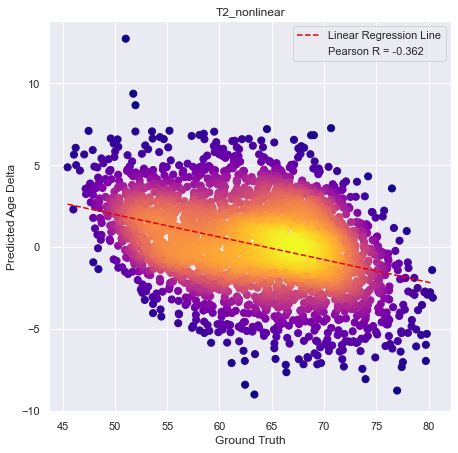

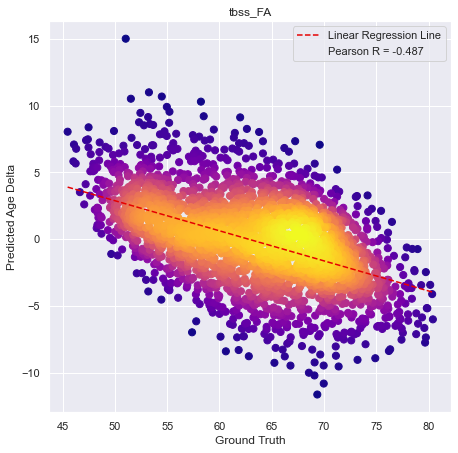

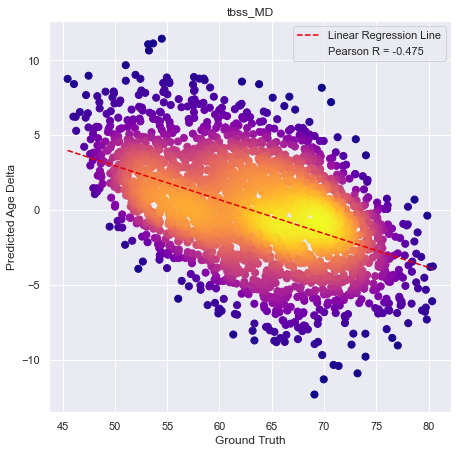

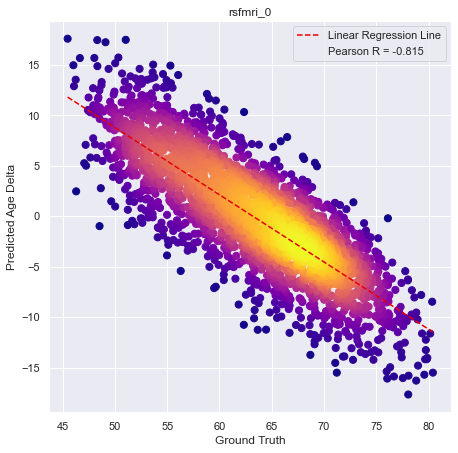

...

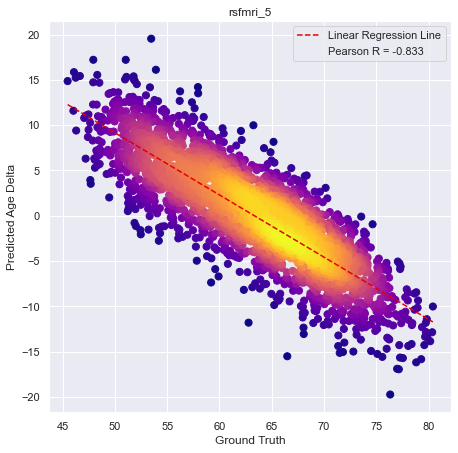

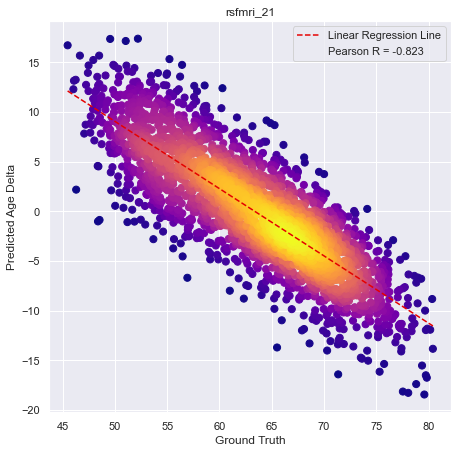

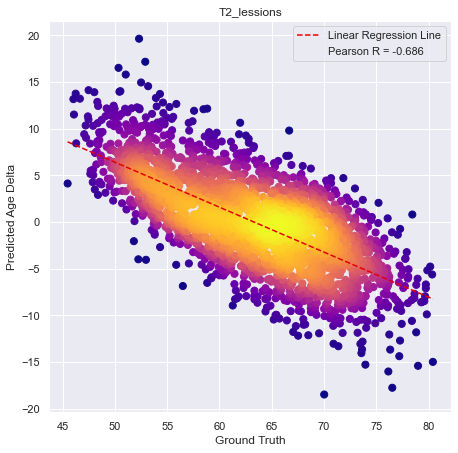

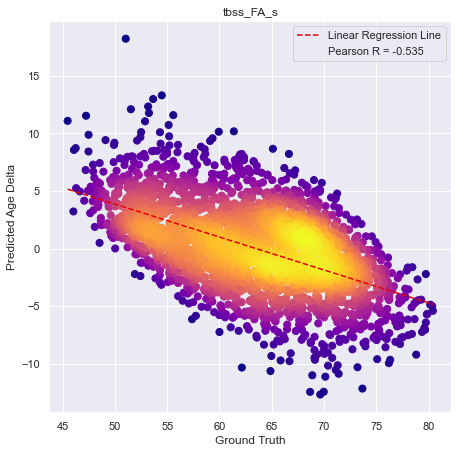

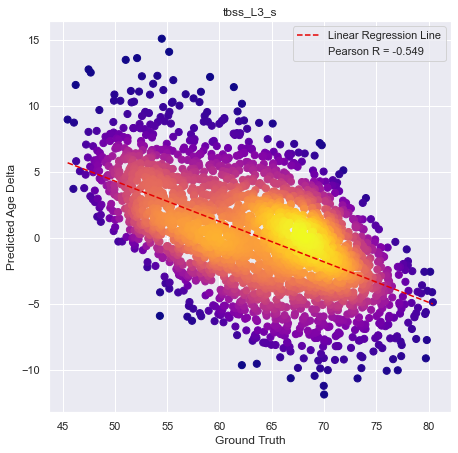

In [40]:
for idx in range(len(df)):
    df_mod = df.iloc[idx].dataframe
    name_mod = df.iloc[idx].modality
    fig = scatter_plot_heatmap(x=df_mod.target_age, y=df_mod.mean_age_delta, xlabel='Ground Truth', 
                               ylabel='Predicted Age Delta', title=name_mod, set_scale=False, 
                               equality_line=False)

# for idx in range(len(df)):
#     df_mod = df.iloc[idx].dataframe
#     name_mod = df.iloc[idx].modality
#     fig = scatter_plot_heatmap(x=df_mod.target_age, y=df_mod.age_delta, xlabel='Ground Truth', 
#                                ylabel='Predicted Age Delta', title=name_mod, set_scale=False, 
#                                equality_line=False)

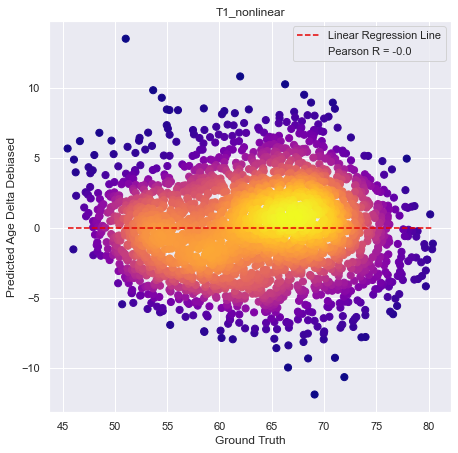

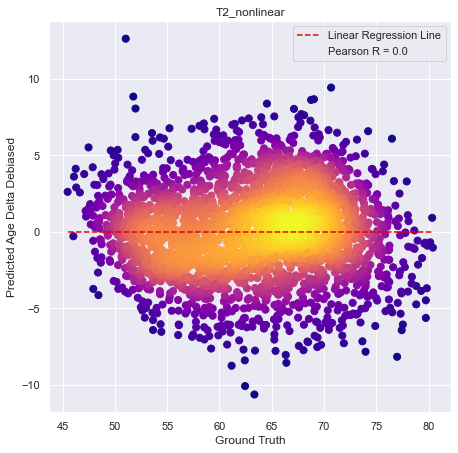

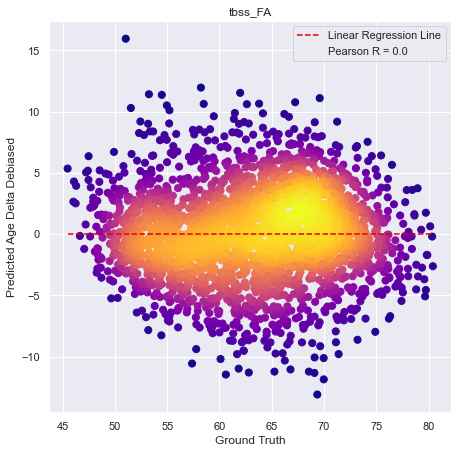

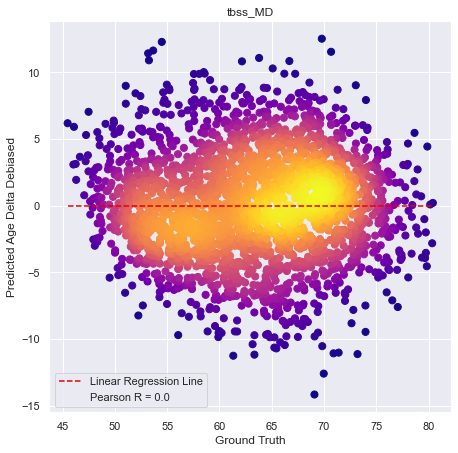

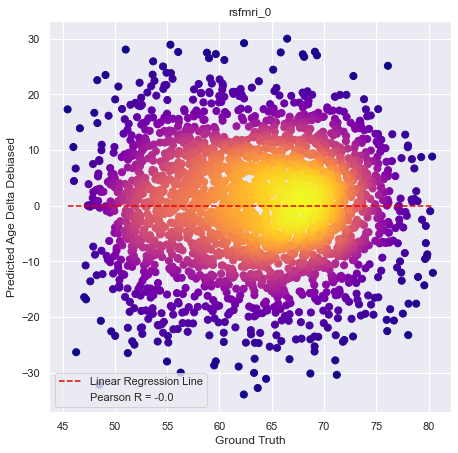

...

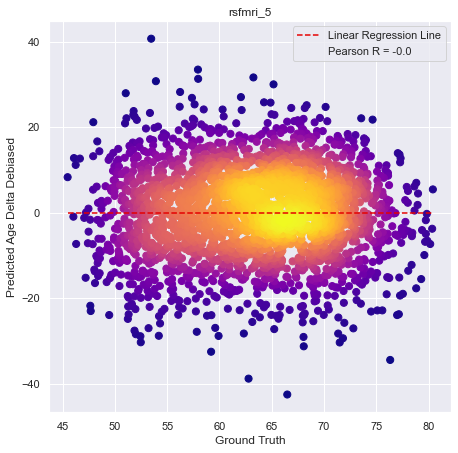

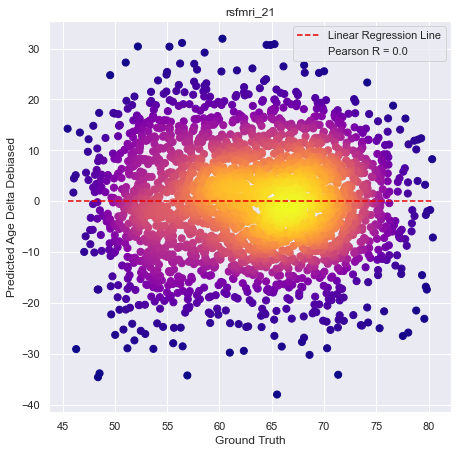

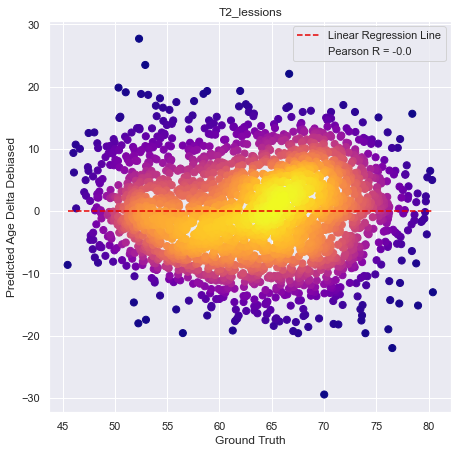

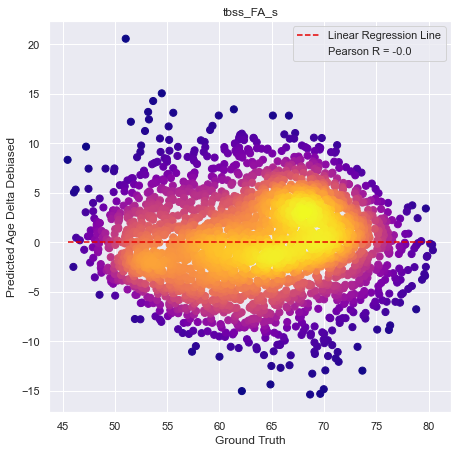

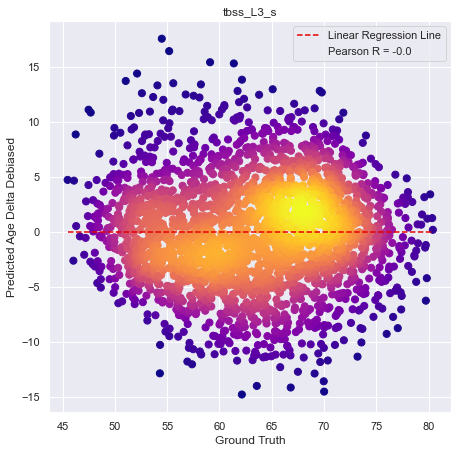

In [41]:
for idx in range(len(df)):
    df_mod = df.iloc[idx].dataframe
    name_mod = df.iloc[idx].modality
    fig = scatter_plot_heatmap(x=df_mod.target_age, y=df_mod.age_delta_decon, xlabel='Ground Truth', 
                               ylabel='Predicted Age Delta Debiased', title=name_mod, set_scale=False, 
                               equality_line=False)

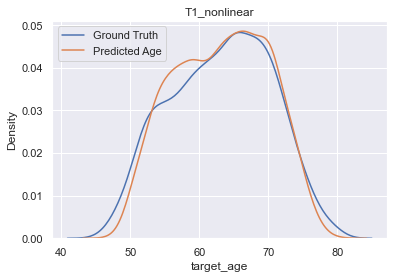

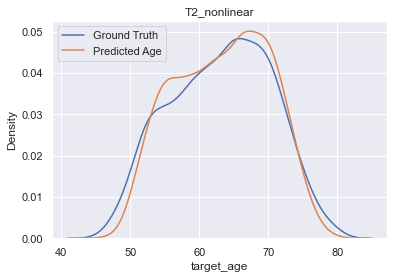

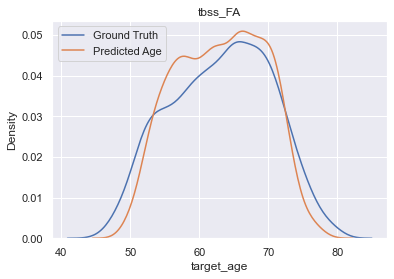

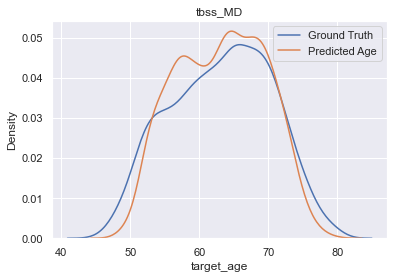

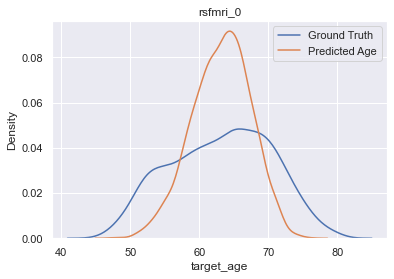

...

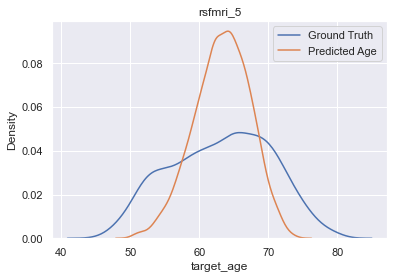

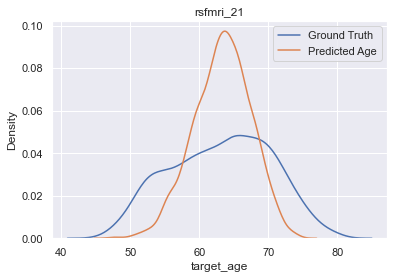

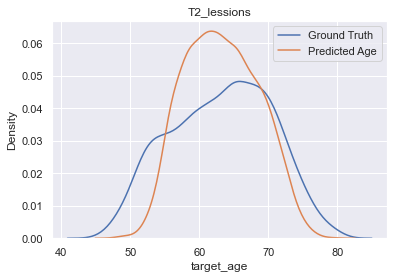

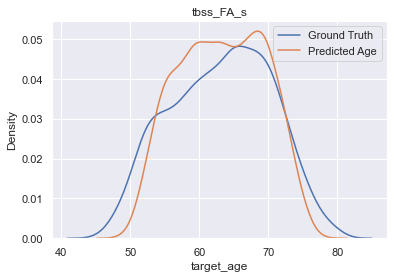

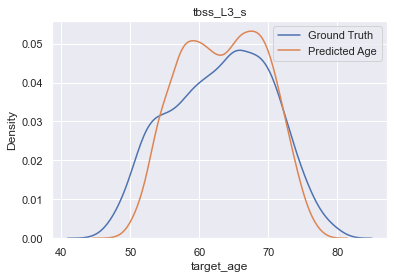

In [42]:
for idx in range(len(df)):
    df_mod = df.iloc[idx].dataframe
    name_mod = df.iloc[idx].modality
    fig = kde_plot(x=df_mod.target_age, y=df_mod.mean_output_age, 
                   xlabel='Ground Truth', ylabel='Predicted Age',
                   title=name_mod)
# for idx in range(len(df)):
#     df_mod = df.iloc[idx].dataframe
#     name_mod = df.iloc[idx].modality
#     fig = kde_plot(x=df_mod.target_age, y=df_mod.output_age, 
#                    xlabel='Ground Truth', ylabel='Predicted Age',
#                    title=name_mod)

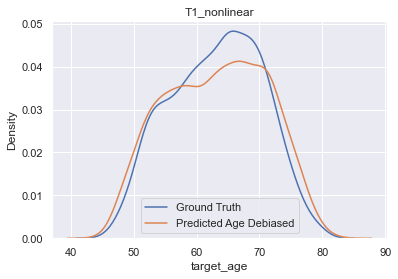

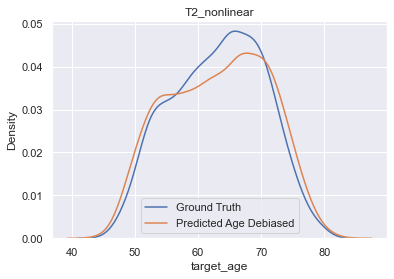

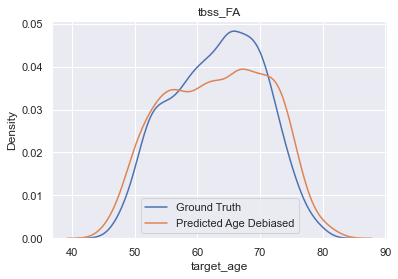

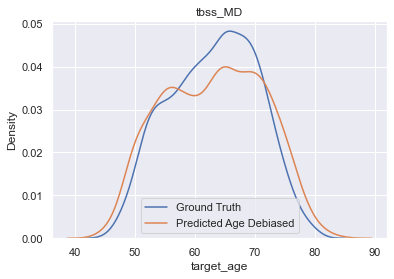

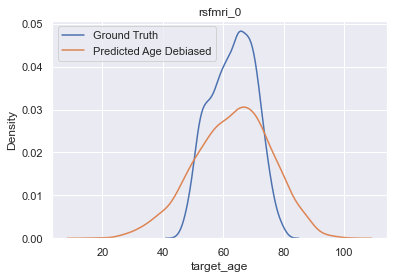

...

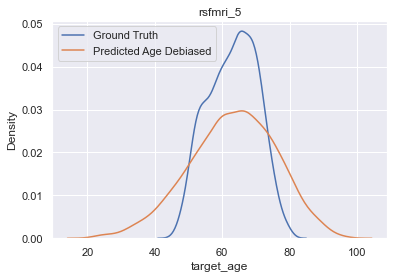

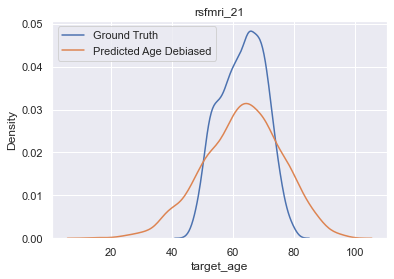

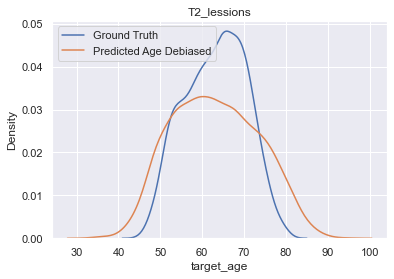

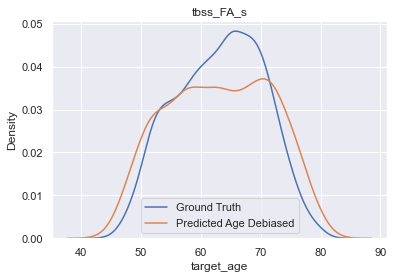

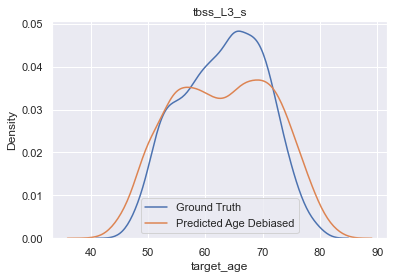

In [43]:
for idx in range(len(df)):
    df_mod = df.iloc[idx].dataframe
    name_mod = df.iloc[idx].modality
    fig = kde_plot(x=df_mod.target_age, y=df_mod.output_age_decon, 
                   xlabel='Ground Truth', ylabel='Predicted Age Debiased',
                   title=name_mod)

In [44]:
!ls '../../multi-age-mapper/Analysis Female - Variance Study'

1.1. Data Variance Study - Original Code Implementation.ipynb
1.2. Averages across young and old subjects + Difference Maps + Location Plots.ipynb
2.1. MAEs, MSEs, PR + Saving Pandas Dataframes - T1, T2, FA Convergence Study.ipynb
2.1.1. MAEs, MSEs, PR + Saving Pandas Dataframes - Single Modality 9-Run Convergence.ipynb
2.1.2. Correlation, Partial Correlation and Scatter Plots.ipynb
2.2. Data Variance Study - Converged Data Analysis - T1, T2, FA.ipynb
2.3. ElasticNet - Converged T1, T2, FA Results-Copy1.ipynb
2.3. ElasticNet - Converged T1, T2, FA Results.ipynb
2.3.1. ElasticNet - Converged Single Modality 9-Run Convergence.ipynb
2.3.2. ElasticNet - Converged T1, T2, FA Results - Using all 12 inputs to ElasticNet.ipynb
2.3.2.1. ElasticNet - Converged Single Modality 9-Run Convergence - Using all singleMod inputs.ipynb
2.4.1. UKB Correlation Analysis - Original vs Converged T1, T2, FA - with half B of Test Data.ipynb
2.4.1.1. UKB Correlation Analysis - Original vs Converged Single Modal

In [4]:
dfCNN = pd.read_pickle('../../multi-age-mapper/Analysis Female - Variance Study/female_test_testB_convergence9.pkl')

In [5]:
def correlation_plot_2(df,df_2, key, title, partial_correlation= False, fig_size=None, fix_colorbar_scale=False,
                      xlabel=None, ylabel=None):
    
    if len(df) < len(df_2):
        dflen = len(df)
        names = df.modality.to_list()
    else:
        dflen = len(df_2)
        names = df_2.modality.to_list()
    
    if partial_correlation == False:
        corr_df1 = []
        for idx1 in range(dflen):
            df1 = df.iloc[idx1].dataframe
            corr_df2 = []
            for idx2 in range(dflen):
                df2 = df_2.iloc[idx2].dataframe
                r, _ = pearsonr(df1[key], df2[key])
                corr_df2.append(r)
            corr_df2 = np.array(corr_df2).astype('float32')
            corr_df1.append(corr_df2)
        corr_df1 = np.array(corr_df1).astype('float32')
        get_corr_plot(corr_df1, labels=names, partial_correlation=partial_correlation,
                      title=title, fig_size=fig_size, fix_colorbar_scale=fix_colorbar_scale,
                     xlabel=xlabel, ylabel=ylabel) 

    return np.diagonal(corr_df1)


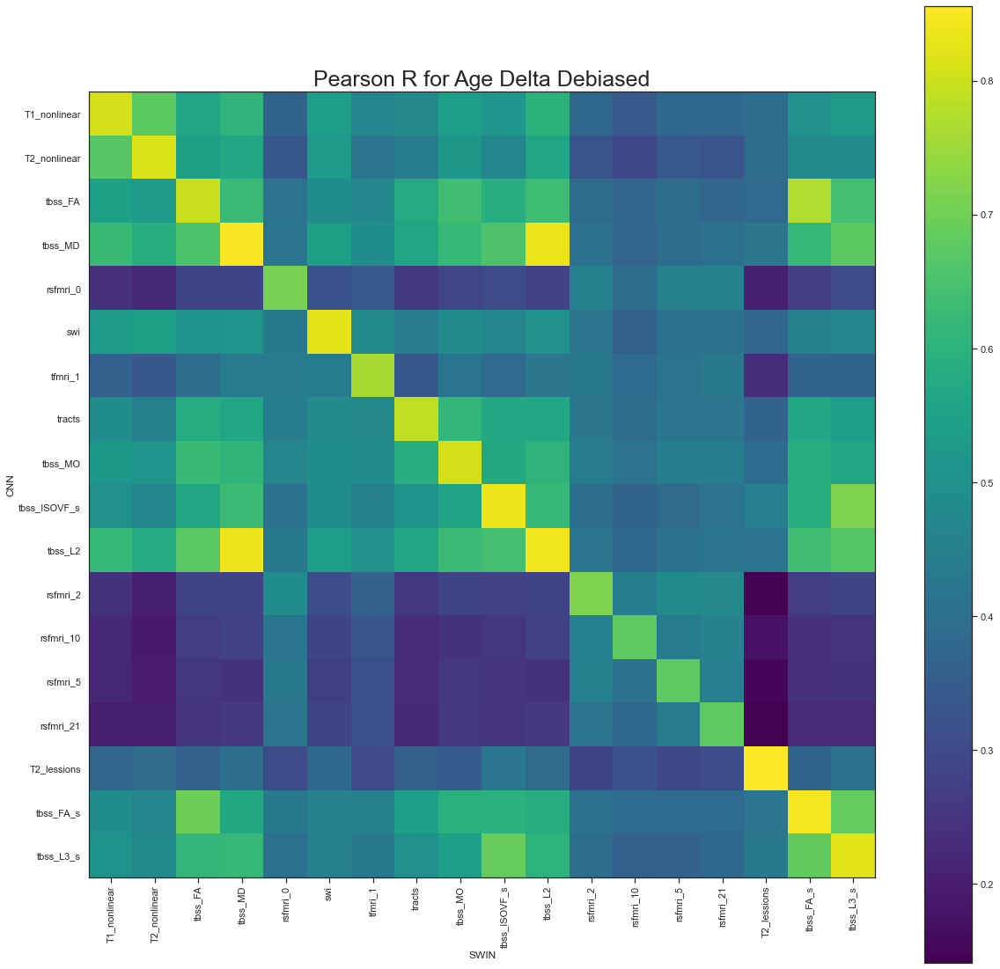

In [47]:
diag = correlation_plot_2(df, dfCNN, key='age_delta_decon', title='Age Delta Debiased', 
                 partial_correlation=False, fig_size=20, xlabel='SWIN', ylabel='CNN')

In [48]:
for idx in range(len(df)):
    print(df.modality[idx], diag[idx])

T1_nonlinear 0.81068367
T2_nonlinear 0.81968826
tbss_FA 0.7981444
tbss_MD 0.85104495
rsfmri_0 0.7102072
swi 0.82712513
tfmri_1 0.76153606
tracts 0.78748775
tbss_MO 0.8110291
tbss_ISOVF_s 0.83841825
tbss_L2 0.8402987
rsfmri_2 0.716751
rsfmri_10 0.6775269
rsfmri_5 0.6788995
rsfmri_21 0.67908543
T2_lessions 0.8560032
tbss_FA_s 0.84693897
tbss_L3_s 0.8262688


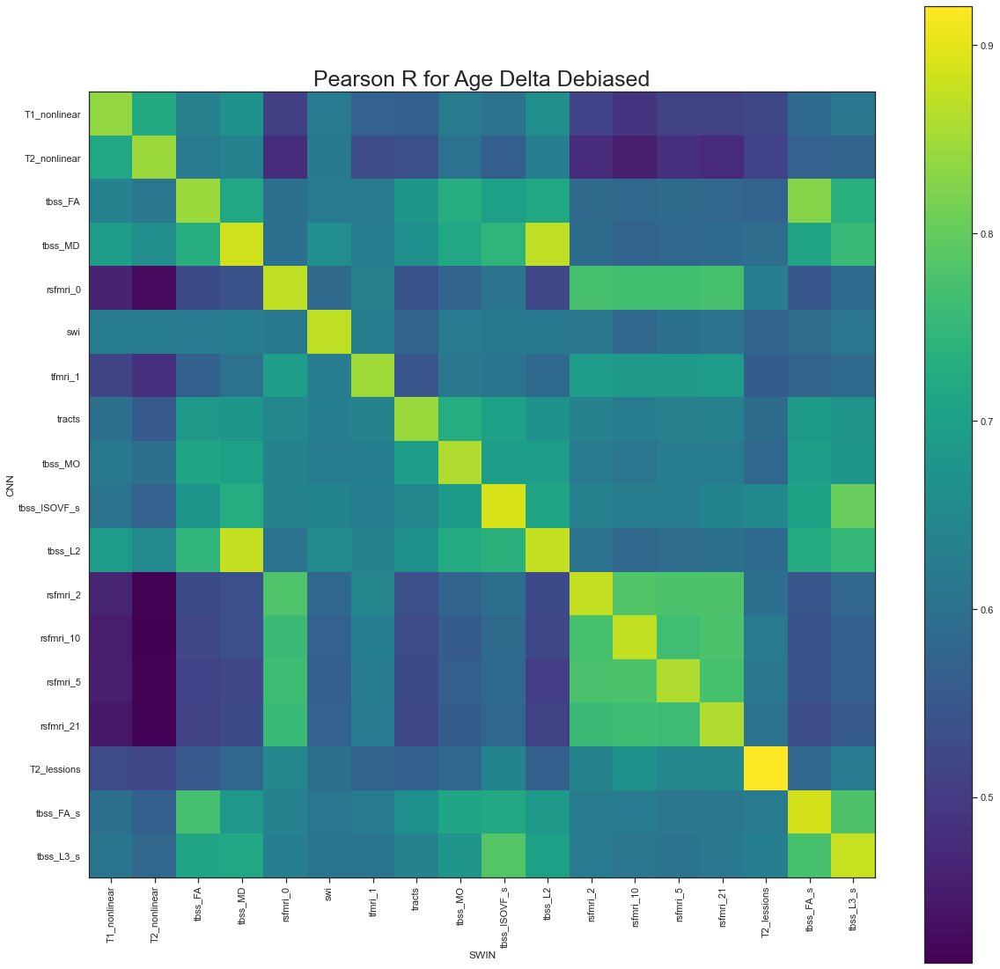

T1_nonlinear 0.83891815
T2_nonlinear 0.8441874
tbss_FA 0.8438675
tbss_MD 0.88512224
rsfmri_0 0.872206
swi 0.8720531
tfmri_1 0.848283
tracts 0.8442497
tbss_MO 0.8608336
tbss_ISOVF_s 0.889898
tbss_L2 0.8754871
rsfmri_2 0.87569106
rsfmri_10 0.874669
rsfmri_5 0.8594113
rsfmri_21 0.8612454
T2_lessions 0.92100364
tbss_FA_s 0.8885537
tbss_L3_s 0.87827796


In [54]:
diag = correlation_plot_2(df, dfCNN, key='mean_age_delta', title='Age Delta Debiased', 
                 partial_correlation=False, fig_size=20, xlabel='SWIN', ylabel='CNN')
for idx in range(len(df)):
    print(df.modality[idx], diag[idx])

In [50]:
dfCNN.modality

0     T1_nonlinear
1     T2_nonlinear
2          tbss_FA
3          tbss_MD
4         rsfmri_0
5              swi
6          tfmri_1
7           tracts
8          tbss_MO
9     tbss_ISOVF_s
10         tbss_L2
11        rsfmri_2
12       rsfmri_10
13        rsfmri_5
14       rsfmri_21
15     T2_lessions
16       tbss_FA_s
17       tbss_L3_s
Name: modality, dtype: object

In [52]:
(df.modality == dfCNN.modality).all()

True

In [5]:
df.iloc[0].dataframe

,Unnamed: 0,target_age,output_age_1,age_delta_1,loss_1,output_age_2,age_delta_2,loss_2,output_age_3,age_delta_3,...,output_age_8,age_delta_8,loss_8,output_age_9,age_delta_9,loss_9,mean_output_age,mean_age_delta,output_age_decon,age_delta_decon
0,24237795,77.280940,72.701675,-4.579262,20.969639,74.382744,-2.898193,8.399525,73.788110,-3.492828,...,70.761940,-6.518997,42.497326,72.915350,-4.365585,19.058334,72.963637,-4.317303,74.620441,-2.660499
1,25463415,58.056694,59.612404,1.555710,2.420233,60.072525,2.015831,4.063575,58.784576,0.727882,...,59.886410,1.829716,3.347860,58.388590,0.331898,0.110156,59.641720,1.585026,58.933942,0.877248
2,25313661,59.653084,55.311880,-4.341206,18.846066,56.850100,-2.802982,7.856710,55.540500,-4.112583,...,56.367317,-3.285767,10.796262,56.161120,-3.491962,12.193802,56.117516,-3.535568,54.784207,-4.868877
3,23521455,53.088700,55.214600,2.125900,4.519452,54.453920,1.365219,1.863823,54.161118,1.072418,...,53.427460,0.338760,0.114759,53.883030,0.794331,0.630961,54.115348,1.026648,52.426663,-0.662037
4,25206481,50.428654,52.410316,1.981663,3.926987,51.553112,1.124458,1.264406,50.006413,-0.422241,...,50.439816,0.011162,0.000125,49.834167,-0.594486,0.353414,50.656148,0.227494,48.353470,-2.075184
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2505,25785977,55.227055,61.862778,6.635723,44.032820,60.457240,5.230187,27.354850,60.595250,5.368195,...,60.783050,5.555996,30.869091,60.140150,4.913094,24.138489,60.861500,5.634445,60.370228,5.143173
2506,25068363,61.883446,63.208225,1.324779,1.755041,62.827950,0.944504,0.892087,65.065180,3.181732,...,62.040924,0.157478,0.024799,60.018467,-1.864979,3.478146,63.101436,1.217990,63.007743,1.124297
2507,22834218,60.501940,60.638573,0.136631,0.018668,61.598965,1.097023,1.203459,61.849216,1.347275,...,57.722404,-2.779537,7.725827,62.027424,1.525482,2.327096,60.572131,0.070191,60.029497,-0.472443
2508,24442683,56.130707,53.978462,-2.152245,4.632157,51.637170,-4.493538,20.191883,52.479760,-3.650948,...,54.830600,-1.300106,1.690276,53.143036,-2.987671,8.926177,52.936217,-3.194490,51.038242,-5.092465


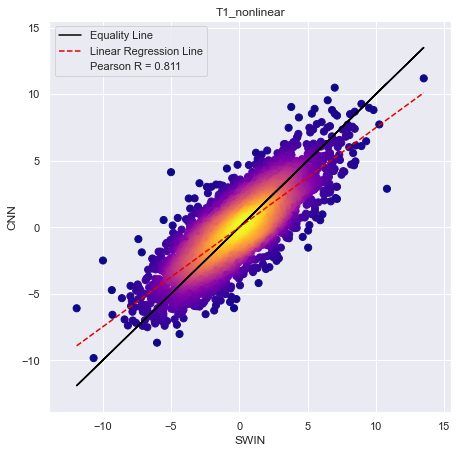

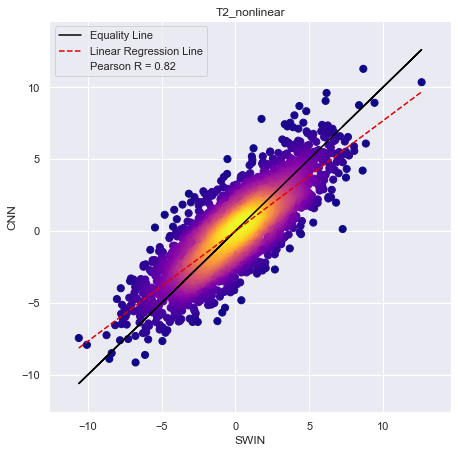

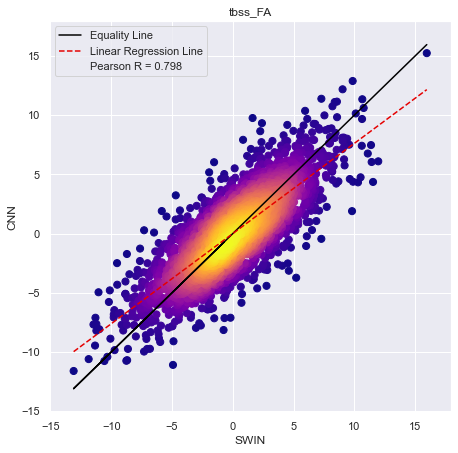

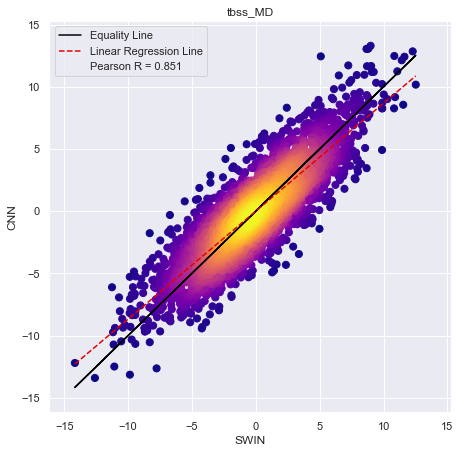

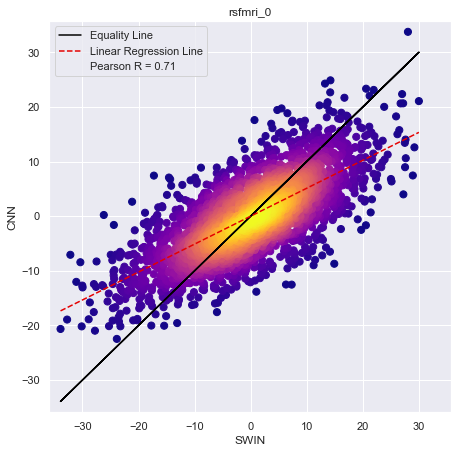

...

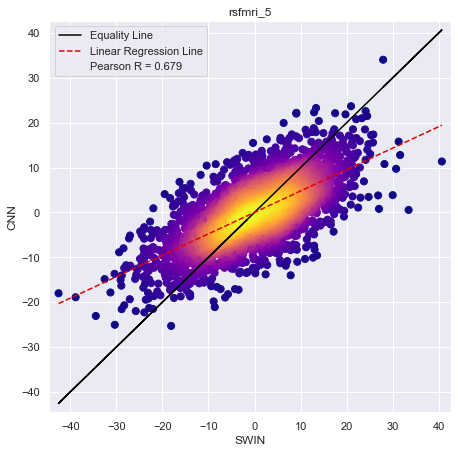

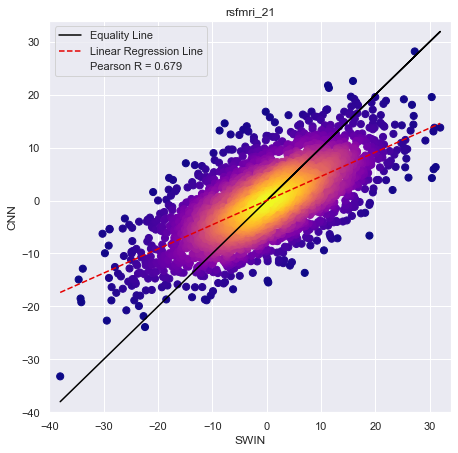

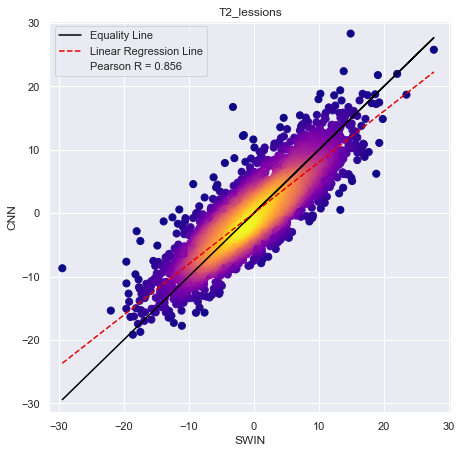

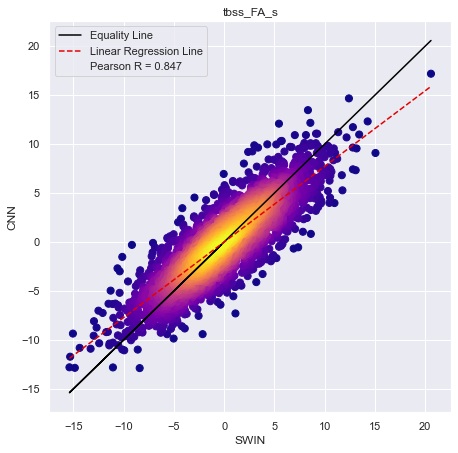

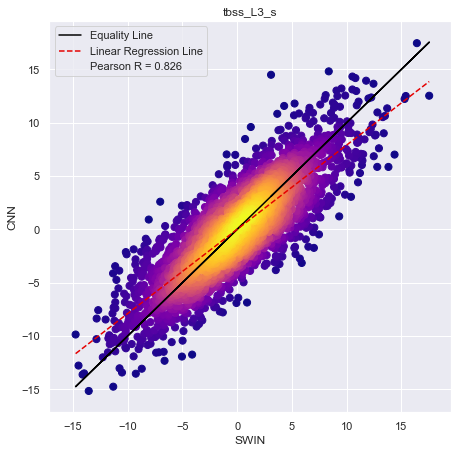

In [6]:
for idx in range(len(df)):
    df_mod = df.iloc[idx].dataframe
    df_cnn_mod = dfCNN.iloc[idx].dataframe
    name_mod = df.iloc[idx].modality
    fig = scatter_plot_heatmap(x=df_mod.age_delta_decon, y=df_cnn_mod.age_delta_decon, xlabel='SWIN', 
                               ylabel='CNN', title=name_mod, set_scale=True)

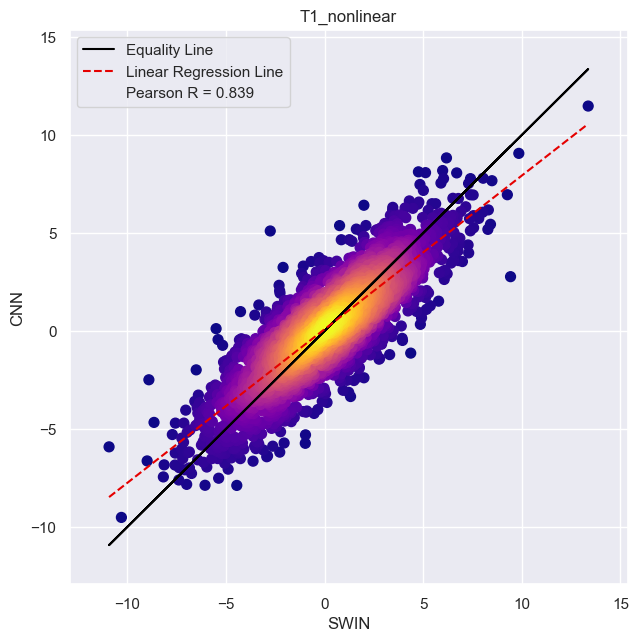

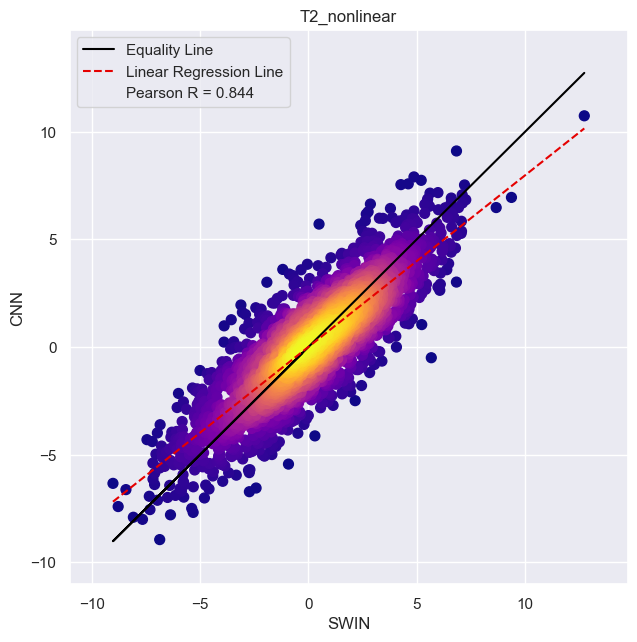

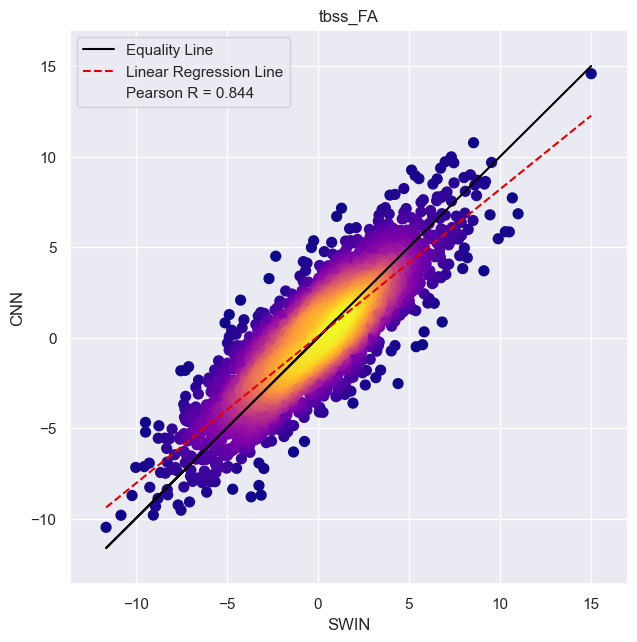

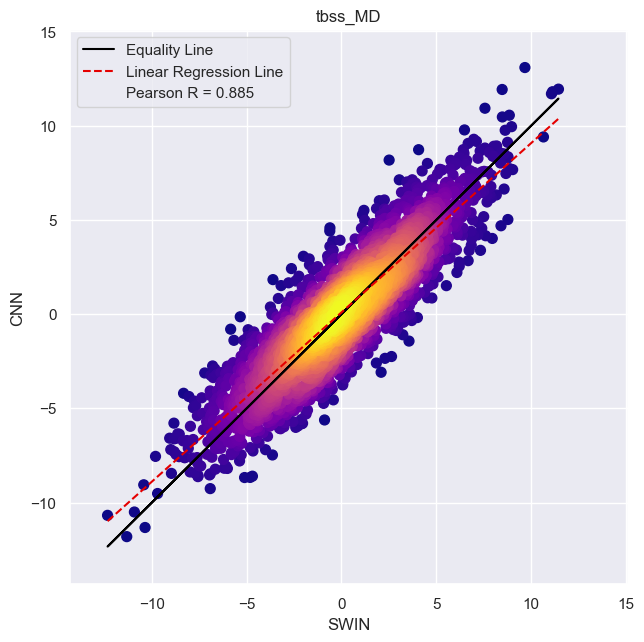

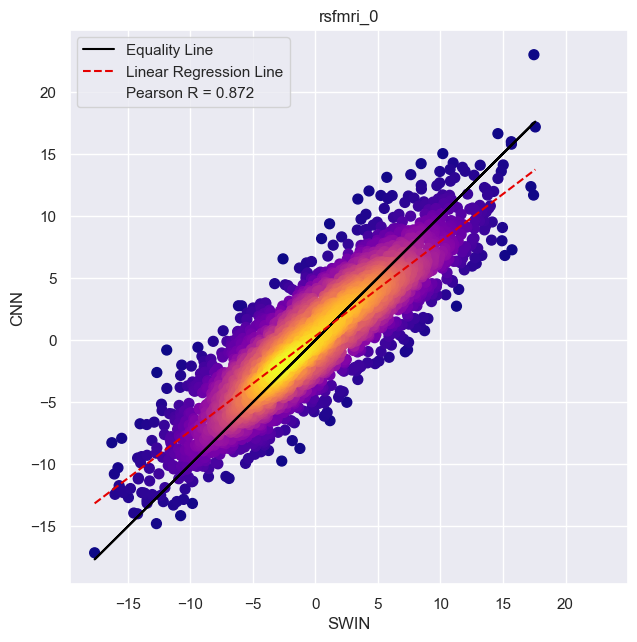

...

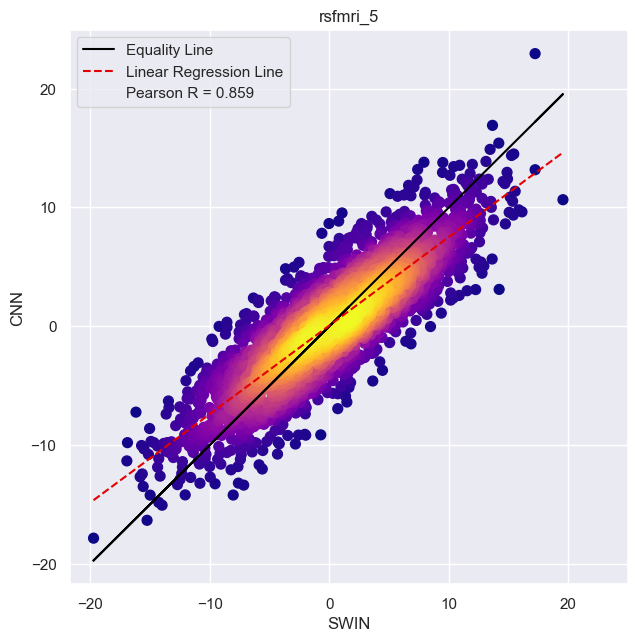

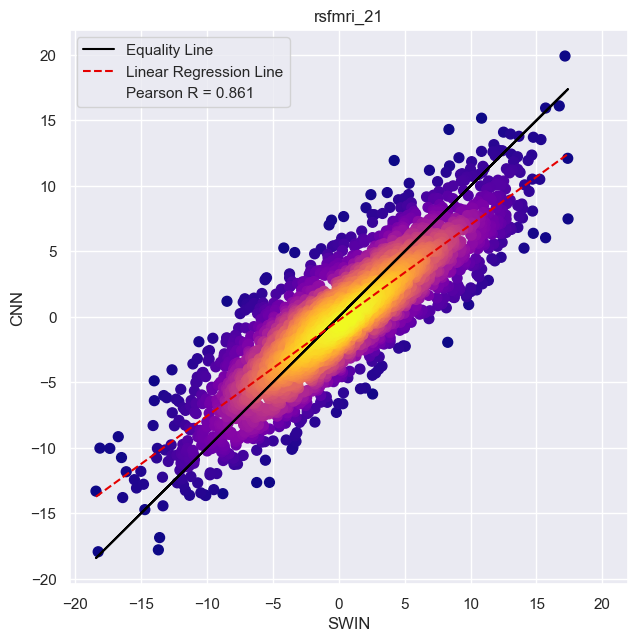

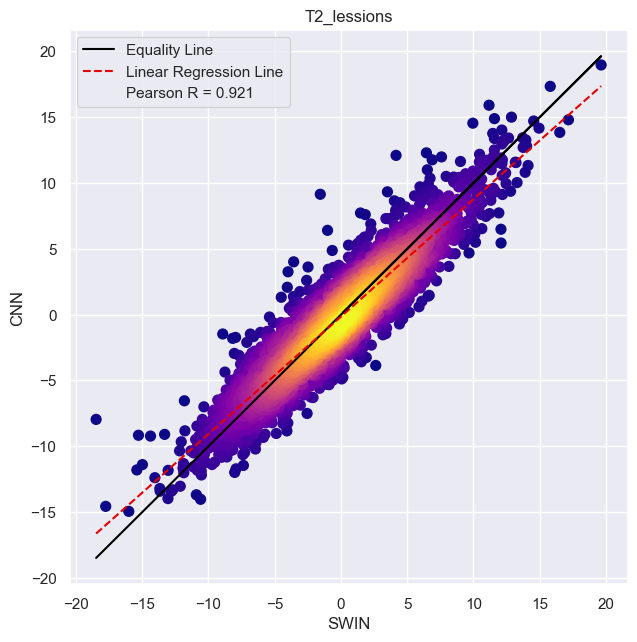

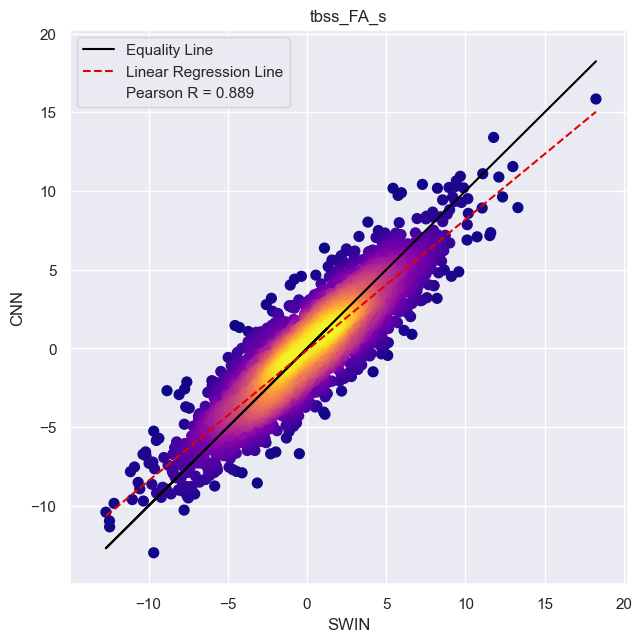

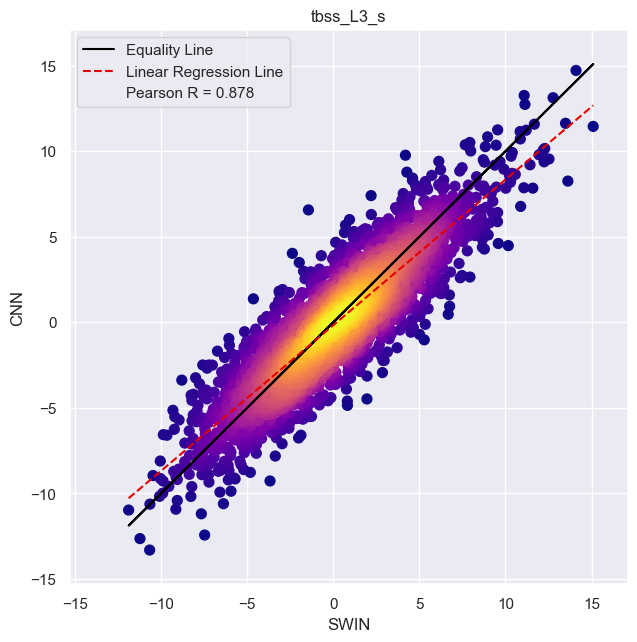

In [6]:
for idx in range(len(df)):
    df_mod = df.iloc[idx].dataframe
    df_cnn_mod = dfCNN.iloc[idx].dataframe
    name_mod = df.iloc[idx].modality
    fig = scatter_plot_heatmap(x=df_mod.mean_age_delta, y=df_cnn_mod.mean_age_delta, xlabel='SWIN', 
                               ylabel='CNN', title=name_mod, set_scale=True)

Text(0.11, 0.5, 'BA-SWIN')

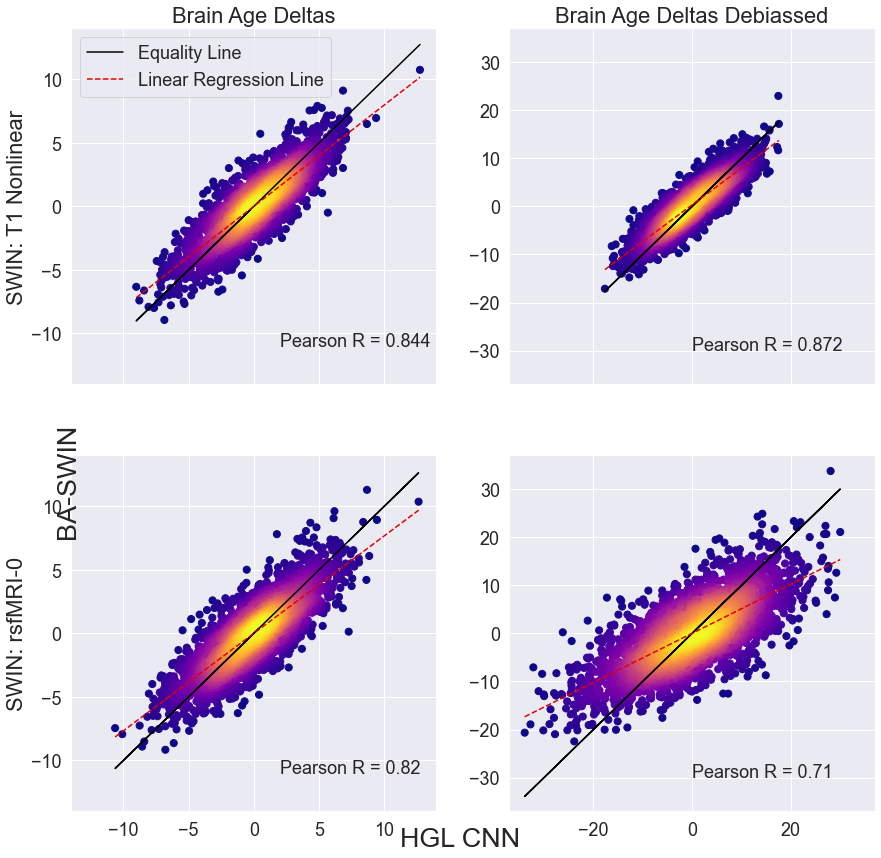

In [43]:
def scatter_plot_heatmap_subplots(ax, x, y, xlabel, ylabel, title, equality_line=True, set_scale=False,
                                 set_y_scale=None, set_hard_scale=None, 
                                  title_font_size=15, x_axis_off_flag=False, y_axis_off_flag=False,
                                  ticks_font_size=12,
                                  plot_legend_flag = True, legend_font = 12, plot_full_legend=True,
                                  text_x=40, text_y=40,
                                 ):
    
    x = x.to_numpy()
    y = y.to_numpy()
    
    sns.set_style("darkgrid", {'image.cmap': u'plasma'})
    xy = np.vstack([x,y])
    z = gaussian_kde(xy)(xy)
    # Sort the points by density, so that the densest points are plotted last
    srt = z.argsort()
    x, y, z = x[srt], y[srt], z[srt]
    ax.scatter(x,y,c=z,s=50)
    if equality_line == True:
        if plot_full_legend==True:
            ax.plot(x, x, ls="-", color = sns.xkcd_rgb['black'], label='Equality Line') #this is just the line of equality
        else:
            ax.plot(x, x, ls="-", color = sns.xkcd_rgb['black']) #this is just the line of equality


    X_mat=np.vstack((np.ones(len(x)), x)).T
    beta_hat = np.linalg.inv(X_mat.T.dot(X_mat)).dot(X_mat.T).dot(y)
    b,w = beta_hat[0],beta_hat[1]
    x2 = np.linspace(np.min(x),np.max(x),num=10)
    y2 = w * x2 + b
    if plot_full_legend==True:
        ax.plot(x2,y2,ls='--', color= sns.xkcd_rgb['red'], label='Linear Regression Line')
    else:
        ax.plot(x2,y2,ls='--', color= sns.xkcd_rgb['red'])
    
    pearson_correlation = pearsonr(x,y)[0]
    
    if set_scale == True:
        x_min, x_max = np.min(x), np.max(x)
        y_min, y_max = np.min(y), np.max(y)
        c_min, c_max = min(x_min, y_min), max(x_max, y_max)
        ax.set_xlim([c_min-2, c_max+2])
        ax.set_ylim([c_min-2, c_max+2])
        
    if set_y_scale != None:
        ax.set_ylim([-set_y_scale-2, set_y_scale+2])
        
    if set_hard_scale!=None:
        ax.set_xlim([set_hard_scale[0]-2, set_hard_scale[1]+2])
        ax.set_ylim([set_hard_scale[2]-2, set_hard_scale[3]+2])
    
    ax.set_xlabel(xlabel,  fontsize=title_font_size)
    ax.set_ylabel(ylabel,  fontsize=title_font_size)
    
    ax.tick_params(axis='x', labelsize= ticks_font_size)
    ax.tick_params(axis='y', labelsize= ticks_font_size)
    
    lbl = 'Pearson R = '+str(round(pearson_correlation,3))
#     ax.plot([],[],' ',label=lbl)
    ax.text(text_x, text_y, lbl, fontsize=legend_font)
    
    ax.set_title(title, fontsize=title_font_size)
    if plot_legend_flag == True:
        ax.legend(fontsize=legend_font, loc=2)
    
    if x_axis_off_flag == True:
        ax.axes.xaxis.set_ticklabels([])
    if y_axis_off_flag == True:
        ax.axes.yaxis.set_ticklabels([])



ncols=2
nrows=2
sz=7.2
title_font_size=22
ticks_font_size=18
legend_font = 18

# df = df.iloc[idx].dataframe
# df_cnn_mod = dfCNN.iloc[idx].dataframe


fig, axes = plt.subplots(ncols=ncols,nrows=nrows,figsize=(ncols*sz,nrows*sz))
axes = axes.ravel()

scatter_plot_heatmap_subplots(ax=axes[0], x=df.iloc[1].dataframe.mean_age_delta, y=dfCNN.iloc[1].dataframe.mean_age_delta, 
                                        xlabel=None, ylabel='SWIN: T1 Nonlinear', 
                                        title='Brain Age Deltas', set_scale=True,
                                  title_font_size=title_font_size, 
                                  set_hard_scale = [-12,12,-12,12],
                                  x_axis_off_flag=True, y_axis_off_flag=False,
                                  ticks_font_size = ticks_font_size,
                                  plot_legend_flag = True, legend_font = legend_font, 
                                  plot_full_legend=True,
                                  text_x=2, text_y=-11,
                                 )

scatter_plot_heatmap_subplots(ax=axes[1], x=df.iloc[4].dataframe.mean_age_delta, y=dfCNN.iloc[4].dataframe.mean_age_delta, 
                                        xlabel=None, ylabel=None, 
                                        title='Brain Age Deltas Debiassed', set_scale=True,
                                  title_font_size=title_font_size, 
                                  set_hard_scale = [-35,35,-35,35],
                                  x_axis_off_flag=True, y_axis_off_flag=False,
                                  ticks_font_size = ticks_font_size,
                                  plot_legend_flag = False, legend_font = legend_font, 
                                  plot_full_legend=True,
                                  text_x=0, text_y=-30,
                                 )

scatter_plot_heatmap_subplots(ax=axes[2], x=df.iloc[1].dataframe.age_delta_decon, y=dfCNN.iloc[1].dataframe.age_delta_decon, 
                                        xlabel=None, ylabel='SWIN: rsfMRI-0', 
                                        title=None, set_scale=True,
                                  title_font_size=title_font_size, 
                                  set_hard_scale = [-12,12,-12,12],
                                  x_axis_off_flag=False, y_axis_off_flag=False,
                                  ticks_font_size = ticks_font_size,
                                  plot_legend_flag = False, legend_font = legend_font, 
                                  plot_full_legend=True,
                                  text_x=2, text_y=-11,
                                 )



scatter_plot_heatmap_subplots(ax=axes[3], x=df.iloc[4].dataframe.age_delta_decon, y=dfCNN.iloc[4].dataframe.age_delta_decon, 
                                        xlabel=None, ylabel=None, 
                                        title=None, set_scale=True,
                                  title_font_size=title_font_size, 
                                  set_hard_scale = [-35,35,-35,35],
                                  x_axis_off_flag=False, y_axis_off_flag=False,
                                  ticks_font_size = ticks_font_size,
                                  plot_legend_flag = False, legend_font = legend_font, 
                                  plot_full_legend=True,
                                  text_x=0, text_y=-30,
                                 )


# fig.subplots_adjust(wspace=0.05, hspace=0.05)
fig.supxlabel('HGL CNN', y=0.11, fontsize=title_font_size+5, verticalalignment='top')
fig.supylabel('BA-SWIN', x=0.11, fontsize=title_font_size+5, verticalalignment='top')

    
    
# fig.savefig('Scatter_Plots_FULL.png', bbox_inches='tight')


In [6]:
df

,modality,dataframe
0,T1_nonlinear,Unnamed: 0 target_age output_age_1 ag...
1,T2_nonlinear,Unnamed: 0 target_age output_age_1 ag...
2,tbss_FA,Unnamed: 0 target_age output_age_1 ag...
3,tbss_MD,Unnamed: 0 target_age output_age_1 ag...
4,rsfmri_0,Unnamed: 0 target_age output_age_1 ag...
5,swi,Unnamed: 0 target_age output_age_1 ag...
6,tfmri_1,Unnamed: 0 target_age output_age_1 ag...
7,tracts,Unnamed: 0 target_age output_age_1 ag...
8,tbss_MO,Unnamed: 0 target_age output_age_1 ag...
9,tbss_ISOVF_s,Unnamed: 0 target_age output_age_1 ag...
